In [1]:
include("harvey.jl")
using .julia


using Random
using LinearAlgebra
using Statistics
using Distributions
using ProgressMeter
using SpecialFunctions


using NLopt

using Plots
using StatsPlots  
using Distributions
using DataFrames

## Simulate

In [2]:
# Define initial state and covariance
n_order = 4  # Adjust based on your model
state_dim = 2 + 2 * n_order
alpha_init = zeros(state_dim)
P1 = Matrix{Float64}(I(state_dim))*100  # Initial covariance matrix

# True parameters for simulation
rho = 0.6
lambda_c = 1.5
sigma_xi2 = 0.006
sigma_kappa2 = 0.007
sigma_epsilon2 = 0.009
params_true = [rho, lambda_c, sigma_xi2, sigma_kappa2, sigma_epsilon2]

n_obs = 300  # Number of observations

# Simulate data
y, alpha = simulate_data(params_true, n_order, n_obs, alpha_init)


([-0.06125939036639755, 0.04669852613438497, -0.24061919236865073, -0.15792548513337806, -0.2724206902588364, -0.2474598501244736, 0.4988899276577259, -0.4442556637900177, -2.206269097712262, -1.3861067143457504  …  -594.7783608100788, -597.1928150709232, -600.8569064436936, -606.9976576005519, -611.0914653964785, -613.3194952414951, -617.4842904258508, -623.212741758805, -627.2850093187687, -630.8763840639359], [0.0 0.0 … 0.0 0.0; 0.0 -0.11334296443503664 … 0.0 0.0; … ; -626.7309119291525 -4.03909714965504 … -0.4618115230715381 0.1397097129754777; -630.7700090788076 -3.9191081699952144 … -0.07472646662614998 0.08623026443601858])

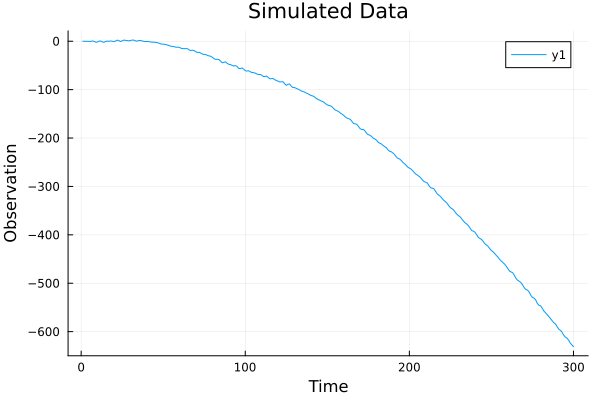

In [3]:
using Plots

plot(y, title="Simulated Data", xlabel="Time", ylabel="Observation")


## Estimate

In [4]:
#Define model
n_order = n_order
state_dim = 2 + 2 * n_order
alpha_init = zeros(state_dim)
alpha_init[1] = y[1]
P1 = Matrix{Float64}(I(state_dim))*100  # Initial covariance matrix

#Priors
a_rho = 0.01
b_rho = 0.97
a_lambda = 0.1
b_lambda = π
a_xi = 1e-6
b_xi = 1e-6
a_kappa = 1e-6
b_kappa = 1e-6
a_epsilon = 1e-6  
b_epsilon = 1e-6
priors = [a_rho, b_rho, a_lambda, b_lambda, a_xi, b_xi, a_kappa, b_kappa, a_epsilon, b_epsilon]




10-element Vector{Float64}:
 0.01
 0.97
 0.1
 3.141592653589793
 1.0e-6
 1.0e-6
 1.0e-6
 1.0e-6
 1.0e-6
 1.0e-6

In [5]:
# Run MCMC initialization
chain_init_burned, Sigma, acceptance_rate_init, chain_init = initialize_mcmc(
    y,
    priors,
    alpha_init, 
    P1, 
    n_order; 
    n_init=40000, 
    burn_init=20000, 
    omega_init=0.03)


Initialization Phase 100%|███████████████████████████████| Time: 0:01:12


Initialization Acceptance Rate: 4.7675 %


([0.45916809941816006 -0.17011037843159765 … -4.798770324403835 -4.916850792176355; 0.45916809941816006 -0.17011037843159765 … -4.798770324403835 -4.916850792176355; … ; 0.28614244423126517 -0.1961562754928048 … -4.258015514422057 -5.280393404331116; 0.28614244423126517 -0.1961562754928048 … -4.258015514422057 -5.280393404331116], [0.006832487122578209 0.0005270938558157945 … -0.016214525001831546 0.00911215585731371; 0.0005270938558157945 0.0006713488164400448 … -0.0015396859619989114 -0.00034355379674680267; … ; -0.016214525001831546 -0.0015396859619989114 … 0.05159207373685027 -0.028625518236831016; 0.00911215585731371 -0.00034355379674680267 … -0.028625518236831016 0.09332966855378623], 0.047675, [0.0 0.0 … 0.0 0.0; -0.08845108122434288 0.16947647492091975 … -0.11616964476409113 -0.1558030259712402; … ; 0.28614244423126517 -0.1961562754928048 … -4.258015514422057 -5.280393404331116; 0.28614244423126517 -0.1961562754928048 … -4.258015514422057 -5.280393404331116])

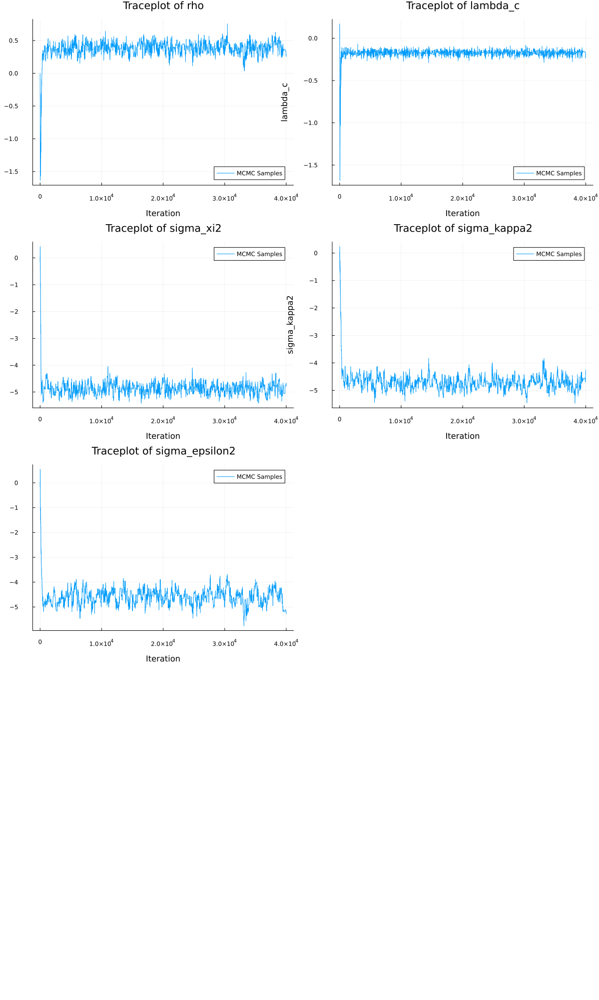

In [6]:
parameters = ["rho", "lambda_c", "sigma_xi2", "sigma_kappa2", "sigma_epsilon2"]
n_params = length(parameters)


# Initialize a list to hold the plots
p_list = []

for i in 1:n_params
    param_samples_init = chain_init[:, i]
    
    
    # Traceplot of MCMC samples
    p2 = plot(param_samples_init, label="MCMC Samples", xlabel="Iteration", ylabel=parameters[i],
              title="Traceplot of $(parameters[i])")

    
    # Add plots to the list
    push!(p_list, p2)
end

# Display the plots in a grid layout
nrows = n_params
ncols = 2
plot(p_list..., layout=(nrows, ncols), size=(1200, 400 * n_params))


In [7]:
# Run MCMC recursion
theta_samples_burned, alpha_samples, acceptance_rate_rec = recursion_mcmc(
    y, 
    priors,
    alpha_init, 
    P1, 
    n_order, 
    chain_init_burned, 
    Sigma; 
    n_rec=20000, 
    burn_rec=10000, 
    omega_rec=0.7)


Recursion Phase 100%|████████████████████████████████████| Time: 0:01:33


Recursion Acceptance Rate: 40.28 %


([0.5806987559881247 1.4649459148230752 … 0.008662223434891059 0.008395473482758035; 0.5946718108726842 1.479436588906211 … 0.007317228549217597 0.009045049301195086; … ; 0.5086824827081908 1.4566190880076642 … 0.01677133063198645 0.011353566583895486; 0.5198596374066907 1.4779049133084965 … 0.013583144373545615 0.009376468538119317], Any[[-0.9258092727798903 0.3022002126159524 … 0.9280893089083904 -47.308909756395124; -0.6236090601669595 0.19324197309967217 … 0.6590747508031995 -1.404048180687463; … ; -626.5408286589536 -4.33078504509295 … -0.7345485204743651 0.31512478866852406; -630.8716137040466 -4.385558648342547 … -0.01663449472435763 0.7333387703009828], [4.622199576514092 -1.0654190080182389 … -4.8312338542017415 -0.039430368879983746; 3.556780568491959 -1.0617005968089916 … -3.3771706910395434 -5.371470953449451; … ; -626.9837863225307 -4.2098206274206476 … -0.41464575360724376 0.3456507056693674; -631.1936069499511 -4.106446660368462 … 0.32939208375678186 0.012733270147649689

In [8]:

# Initial guesses for parameters
initial_params = [0.5, 0.2, 0.5, 0.5, 0.5]

# Bounds for parameters
lower_bounds = [0.0, 0.0, 1e-6, 1e-6, 1e-6]
upper_bounds = [0.999, π, Inf, Inf, Inf]


# Define the objective function
function obj(params::Vector, grad::Vector)
    try
        return negative_log_likelihood(params, y, alpha_init, P1, n_order)
    catch e
        return 1e10  # Return a large number in case of error
    end
end

# Create the optimizer
opt = Opt(:LN_NELDERMEAD, length(initial_params))
opt.lower_bounds = lower_bounds
opt.upper_bounds = upper_bounds
opt.min_objective = obj
opt.maxeval = 1000
opt.xtol_rel = 1e-6

# Run the optimization
(minf, estimated_params, ret) = NLopt.optimize(opt, initial_params)

# Display the estimated parameters
println("Estimated Parameters: ", estimated_params)


Estimated Parameters: [0.43466630293368486, 1.5740570917183132, 0.0034156910422235296, 0.06600188547484152, 1.0e-6]


In [9]:
parameters = ["rho", "lambda_c", "sigma_xi2", "sigma_kappa2", "sigma_epsilon2"]
n_params = length(parameters)


5

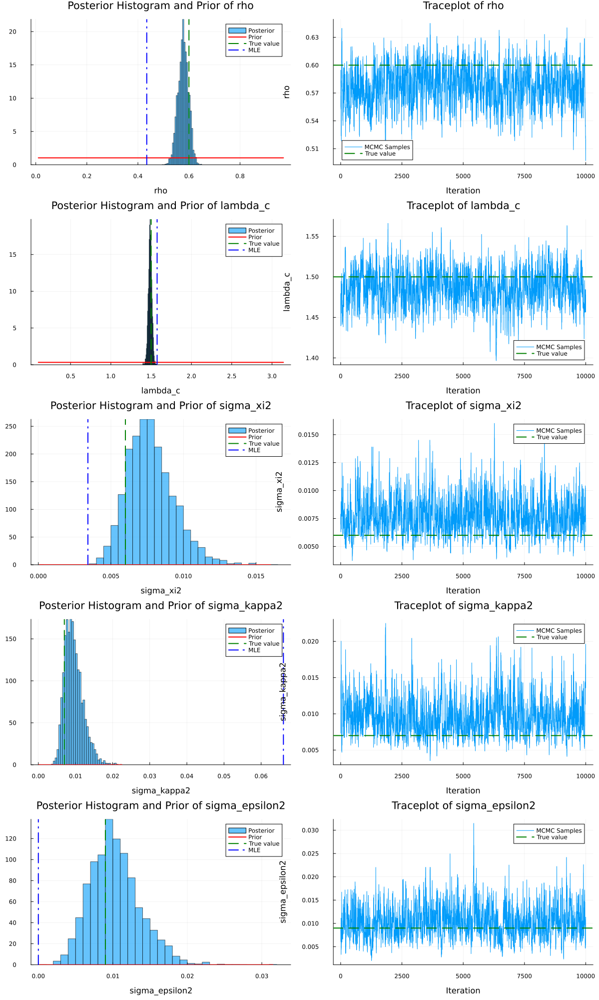

In [10]:
# Initialize a list to hold the plots
p_list = []

for i in 1:n_params
    param_samples = theta_samples_burned[:, i]
    
    # Histogram of posterior samples
    p1 = histogram(param_samples, bins=50, normalize=true, alpha=0.6,
                   label="Posterior", xlabel=parameters[i], ylabel="Density",
                   title="Posterior Histogram and Prior of $(parameters[i])")
    
    # Define the prior distribution
    if parameters[i] == "rho"
        # Uniform prior between 0 and 0.999
        a = a_rho
        b = b_rho
        x_values = range(a, b, length=200)
        prior_pdf = pdf.(Uniform(a, b), x_values)
    elseif parameters[i] == "lambda_c"
        # Uniform prior between 0 and π
        a = a_lambda
        b = b_lambda
        x_values = range(a, b, length=200)
        prior_pdf = pdf.(Uniform(a, b), x_values)
    else
        # Inverse-Gamma prior with a=3, b=1
        a_ig = a_epsilon
        b_ig = b_epsilon
        x_min = 0.0
        x_max = maximum(param_samples)
        x_values = range(x_min, x_max, length=200)
        prior_pdf = pdf.(InverseGamma(a_ig, b_ig), x_values)
    end
    
    # Overlay prior PDF on histogram
    plot!(p1, x_values, prior_pdf, label="Prior", color=:red, linewidth=2)
    
    # Include true parameter value
    vline!(p1, [params_true[i]], label="True value", color=:green, linestyle=:dash, linewidth=2)
    
    # If you have MLE estimates, include them (uncomment and define `estimated_params`)
    vline!(p1, [estimated_params[i]], label="MLE", color=:blue, linestyle=:dashdot, linewidth=2)
    
    # Traceplot of MCMC samples
    p2 = plot(param_samples, label="MCMC Samples", xlabel="Iteration", ylabel=parameters[i],
              title="Traceplot of $(parameters[i])")
    hline!(p2, [params_true[i]], label="True value", color=:green, linestyle=:dash, linewidth=2)
    
    # Add plots to the list
    push!(p_list, p1)
    push!(p_list, p2)
end

# Display the plots in a grid layout
nrows = n_params
ncols = 2
plot(p_list..., layout=(nrows, ncols), size=(1200, 400 * n_params))


In [11]:
# Calculate means of posterior samples
chain_rec_burned_means = mean(theta_samples_burned, dims=1)  # 1 x n_params array
chain_rec_burned_means = vec(chain_rec_burned_means)  # Convert to a vector


5-element Vector{Float64}:
 0.5777103778281446
 1.487067497662904
 0.007754805913152828
 0.009572796379052626
 0.010302568501118818

In [12]:

# Create the DataFrame
data = DataFrame(Dict(
    "Parameter" => parameters,
    "MCMC Estimate" => chain_rec_burned_means,
    "MLE Estimate" => estimated_params,  # Include if available
    "True Value" => params_true
))

# Display the DataFrame
display(data)


Row,MCMC Estimate,MLE Estimate,Parameter,True Value
,Float64,Float64,String,Float64
1,0.57771,0.434666,rho,0.6
2,1.48707,1.57406,lambda_c,1.5
3,0.00775481,0.00341569,sigma_xi2,0.006
4,0.0095728,0.0660019,sigma_kappa2,0.007
5,0.0103026,1.0e-6,sigma_epsilon2,0.009


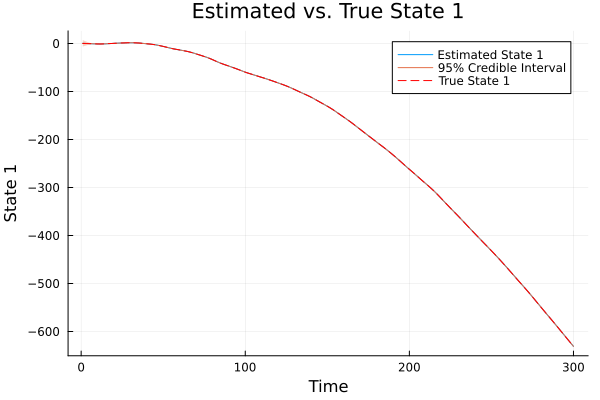

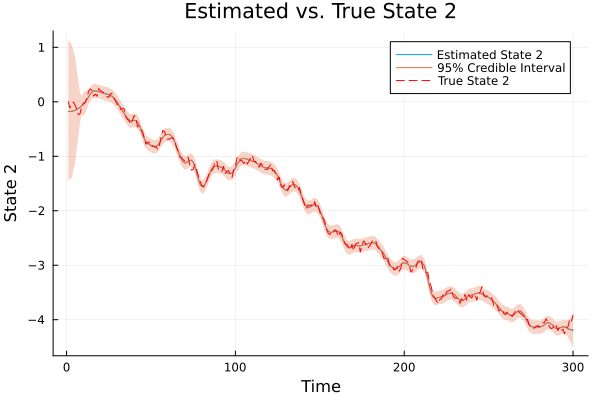

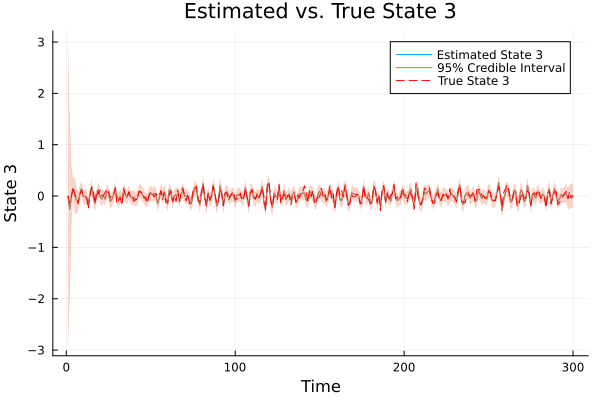

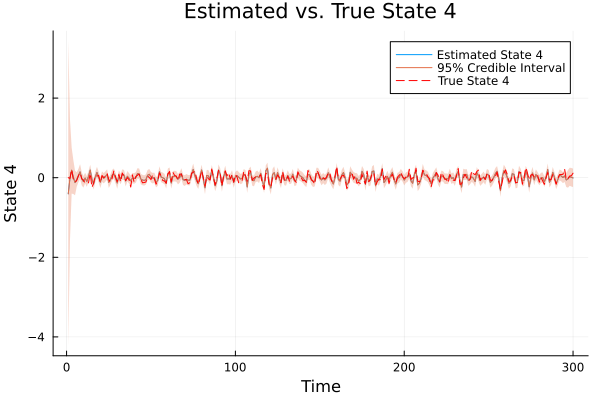

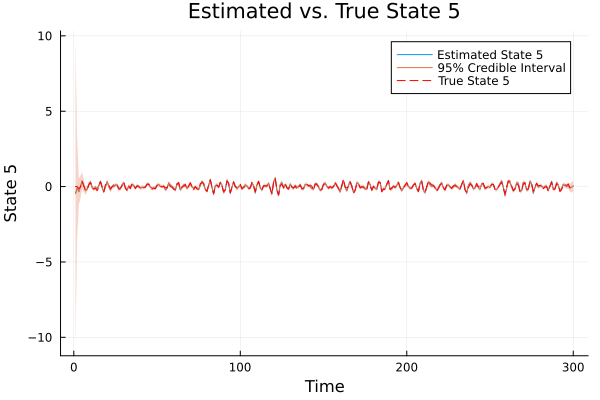

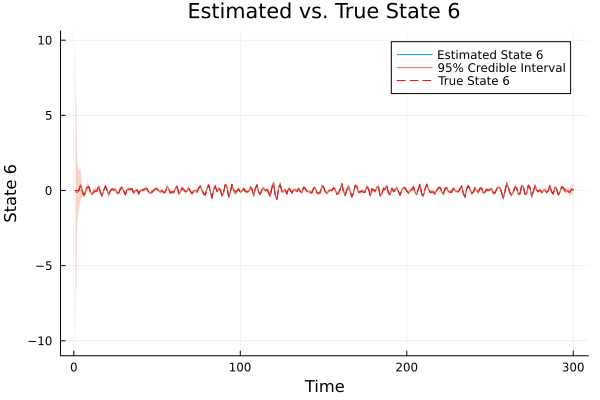

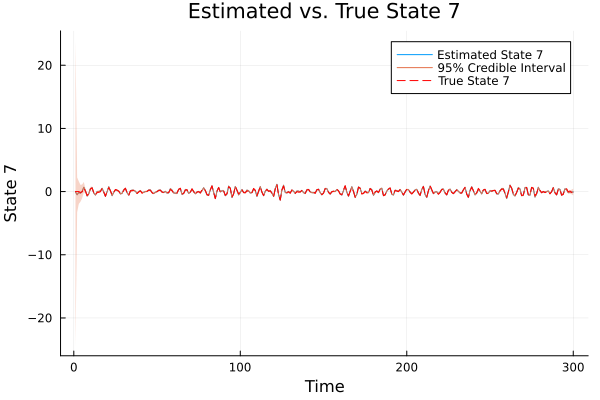

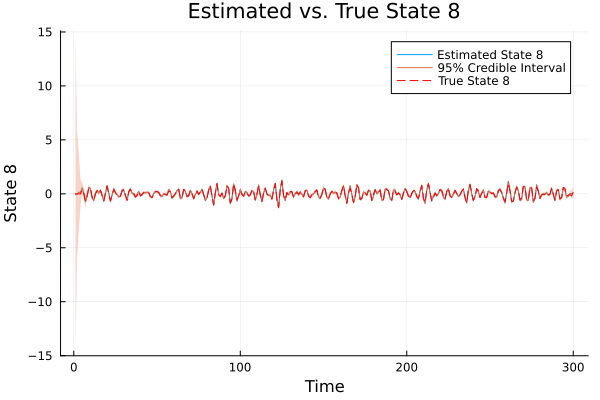

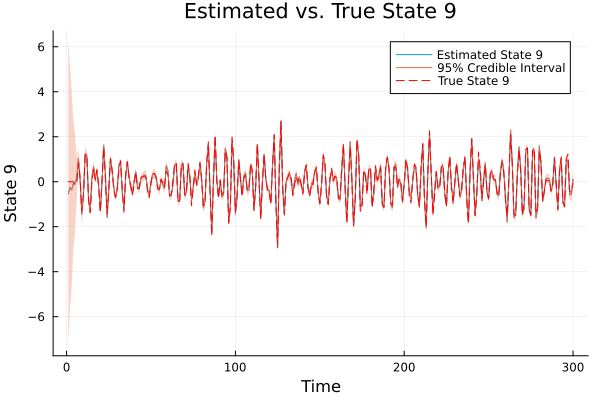

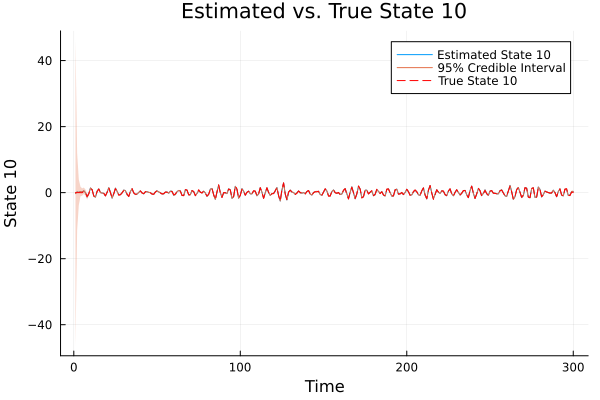

In [13]:
# Collect alpha samples into a 3D array
n_samples = length(alpha_samples)
n_time_steps = size(alpha_samples[1], 1)
state_dim = size(alpha_samples[1], 2)

# Initialize array to hold alpha samples
alpha_samples_array = Array{Float64}(undef, n_samples, n_time_steps, state_dim)

for i in 1:n_samples
    alpha_samples_array[i, :, :] = alpha_samples[i]
end


# Compute posterior mean over samples (dimension 1)
alpha_mean = mean(alpha_samples_array, dims=1)  # 1 x n_time_steps x state_dim
alpha_mean = dropdims(alpha_mean; dims=1)  # n_time_steps x state_dim

# Compute credible intervals
alpha_lower = mapslices(x -> quantile(x, 0.025), alpha_samples_array; dims=1)
alpha_lower = dropdims(alpha_lower; dims=1)
alpha_upper = mapslices(x -> quantile(x, 0.975), alpha_samples_array; dims=1)
alpha_upper = dropdims(alpha_upper; dims=1)



time = 1:n_time_steps

for s in 1:state_dim
    p = plot(time, alpha_mean[:, s], label="Estimated State $(s)", xlabel="Time",
             ylabel="State $(s)", title="Estimated vs. True State $(s)")
    
    # Add credible intervals using the `ribbon` argument
    plot!(time, alpha_mean[:, s], ribbon=(alpha_mean[:, s] .- alpha_lower[:, s],
          alpha_upper[:, s] .- alpha_mean[:, s]), fillalpha=0.3, label="95% Credible Interval")
    
    # Plot true state (assuming you have `alpha_true` from data simulation)
    plot!(time, alpha[1:n_time_steps, s], label="True State $(s)", linestyle=:dash, color=:red)
    
    display(p)
end


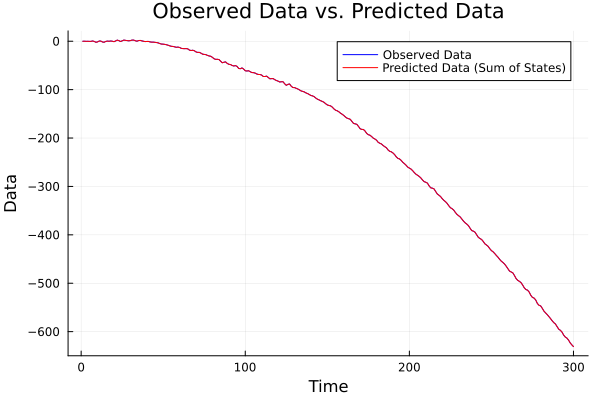

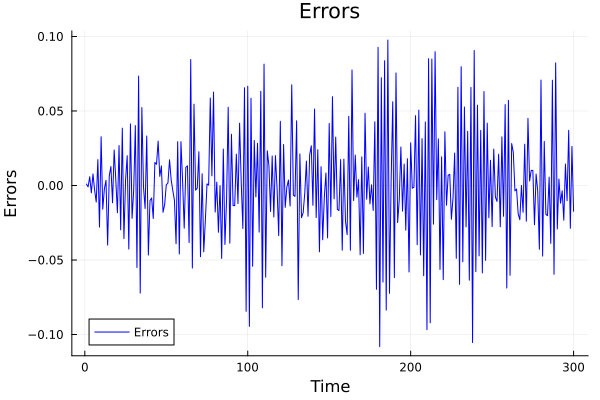

In [14]:
# Compute y_pred
# Adjust indices according to your state-space model
state_indices = [1, 2 + 2 * n_order-1]  

y_pred = alpha_mean[:, state_indices[1]] .+ alpha_mean[:, state_indices[2]]


# Adjust time and observed data if necessary
# If y_pred has fewer time points than y, adjust y accordingly
time = 1:length(y_pred)
y_adjusted = y[1:length(y_pred)]  # Adjust if lengths differ

p = plot(time, y_adjusted, label="Observed Data", color=:blue)
plot!(p, time, y_pred, label="Predicted Data (Sum of States)", color=:red)
xlabel!("Time")
ylabel!("Data")
title!("Observed Data vs. Predicted Data")
display(p)


errors = y_adjusted .- y_pred

p_error = plot(time, errors, label="Errors", color=:blue)
xlabel!("Time")
ylabel!("Errors")
title!("Errors")
display(p_error)
